In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import models, layers
import zipfile
import numpy as np

In [ ]:
dataset_path = '/content/drive/MyDrive/datasets/potato-disease.zip' # (Download the dataset from kaggle: https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset)
zip_ref = zipfile.ZipFile(dataset_path, 'r')
zip_ref.extractall('./leaf-disease-dataset')
zip_ref.close()

In [ ]:
!mkdir './dataset'

In [ ]:
!cp -a '/content/leaf-disease-dataset/PlantVillage/Potato___Early_blight' './dataset'
!cp -a '/content/leaf-disease-dataset/PlantVillage/Potato___Late_blight' './dataset'
!cp -a '/content/leaf-disease-dataset/PlantVillage/Potato___healthy' './dataset'

In [ ]:
IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3

In [ ]:
leaf_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    './dataset',
    shuffle=True,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 2152 files belonging to 3 classes.


In [ ]:
class_names = leaf_dataset.class_names
print(class_names)

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']


In [ ]:
len(leaf_dataset)

68

In [ ]:
for image_batch, image_labels in leaf_dataset.take(1):
  print(image_batch.shape)
  print(image_labels.numpy())

(32, 256, 256, 3)
[1 1 1 2 1 0 1 0 2 1 0 0 0 1 0 0 1 1 1 1 2 1 1 1 1 0 0 1 0 2 0 1]


In [ ]:
image_batch[0]

<tf.Tensor: shape=(256, 256, 3), dtype=float32, numpy=
array([[[165., 166., 184.],
        [162., 163., 181.],
        [161., 162., 180.],
        ...,
        [102.,  98., 112.],
        [113., 109., 123.],
        [122., 118., 132.]],

       [[164., 165., 183.],
        [164., 165., 183.],
        [163., 164., 182.],
        ...,
        [118., 114., 128.],
        [109., 105., 119.],
        [ 95.,  91., 105.]],

       [[164., 165., 183.],
        [166., 167., 185.],
        [166., 167., 185.],
        ...,
        [108., 104., 118.],
        [104., 100., 114.],
        [ 98.,  94., 108.]],

       ...,

       [[166., 168., 181.],
        [168., 170., 183.],
        [170., 172., 185.],
        ...,
        [101.,  98., 109.],
        [102.,  99., 110.],
        [111., 108., 119.]],

       [[163., 165., 178.],
        [165., 167., 180.],
        [169., 171., 184.],
        ...,
        [104., 101., 112.],
        [103., 100., 111.],
        [104., 101., 112.]],

       [[160., 16

In [ ]:
image_batch[0].shape

TensorShape([256, 256, 3])

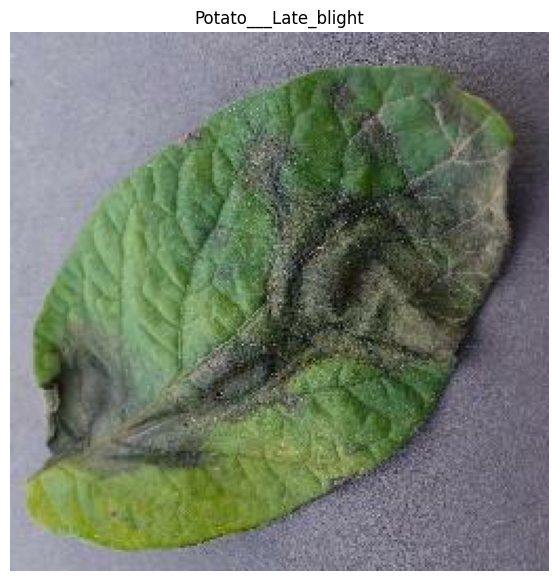

In [ ]:
plt.figure(figsize=(10, 7))
plt.imshow(image_batch[0].numpy().astype('uint8'))
plt.grid(False)
plt.axis('off')
plt.title(class_names[image_labels[0]])
plt.show()

In [ ]:
def display_dataset(leaf_dataset, title='Dataset'):
  fig = plt.gcf()
  fig.suptitle(title)
  fig.set_size_inches(16, 16)

  for image_batch, label_batch in leaf_dataset.take(1):
    for i in range(16):
      sp = plt.subplot(4, 4, i+1)
      plt.imshow(image_batch[i].numpy().astype('uint8'))
      plt.title(class_names[label_batch[i]])
      plt.grid(False)
      plt.axis('off')

  plt.show()

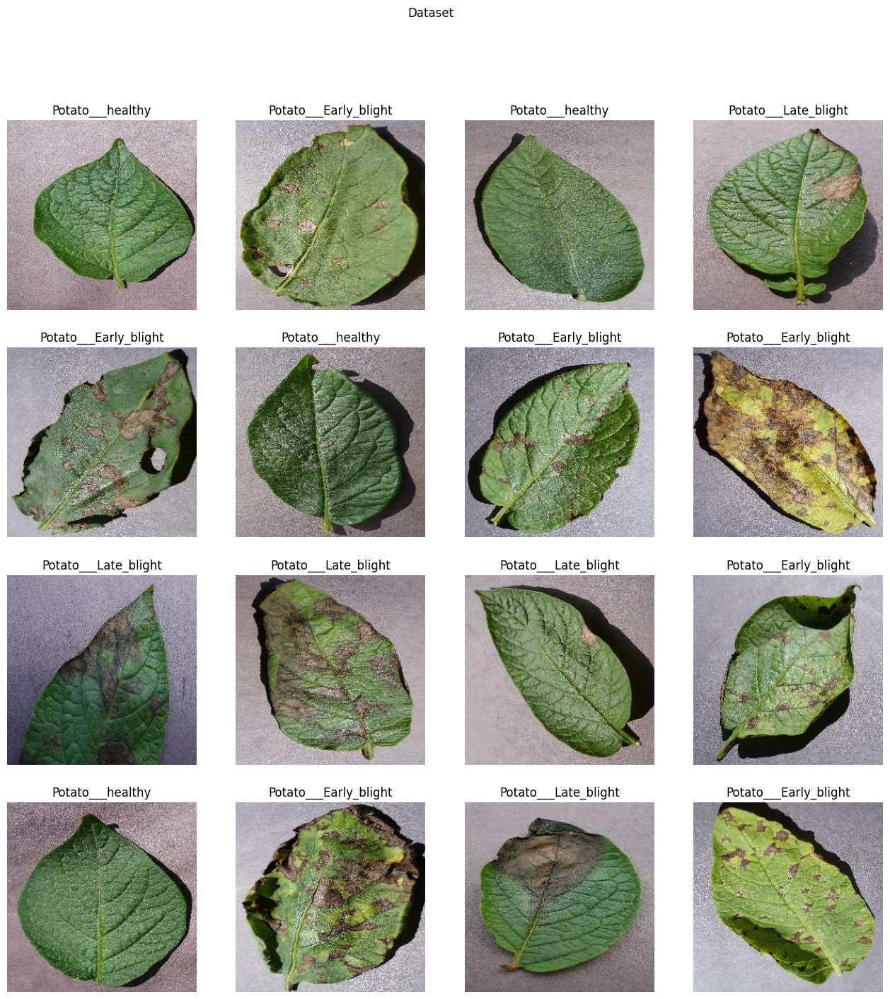

In [ ]:
display_dataset(leaf_dataset)

In [ ]:
def get_dataset_splits(leaf_dataset, train_split_size=0.8, val_split_size=0.1, test_split_size=0.1, shuffle=True, shuffle_size=10000):
  total_len = len(leaf_dataset)

  if shuffle:
    leaf_dataset = leaf_dataset.shuffle(shuffle_size, seed=42)

  train_split_size = round(total_len * train_split_size)
  test_split_size = round(total_len * test_split_size)
  val_split_size = round(total_len * val_split_size)

  train_ds = leaf_dataset.take(train_split_size)
  val_ds = leaf_dataset.skip(train_split_size).take(val_split_size)
  test_ds = leaf_dataset.skip(train_split_size).skip(val_split_size)

  return train_ds, val_ds, test_ds

In [ ]:
train_ds, val_ds, test_ds = get_dataset_splits(leaf_dataset)
len(leaf_dataset) == (len(train_ds) + len(val_ds) + len(test_ds))

True

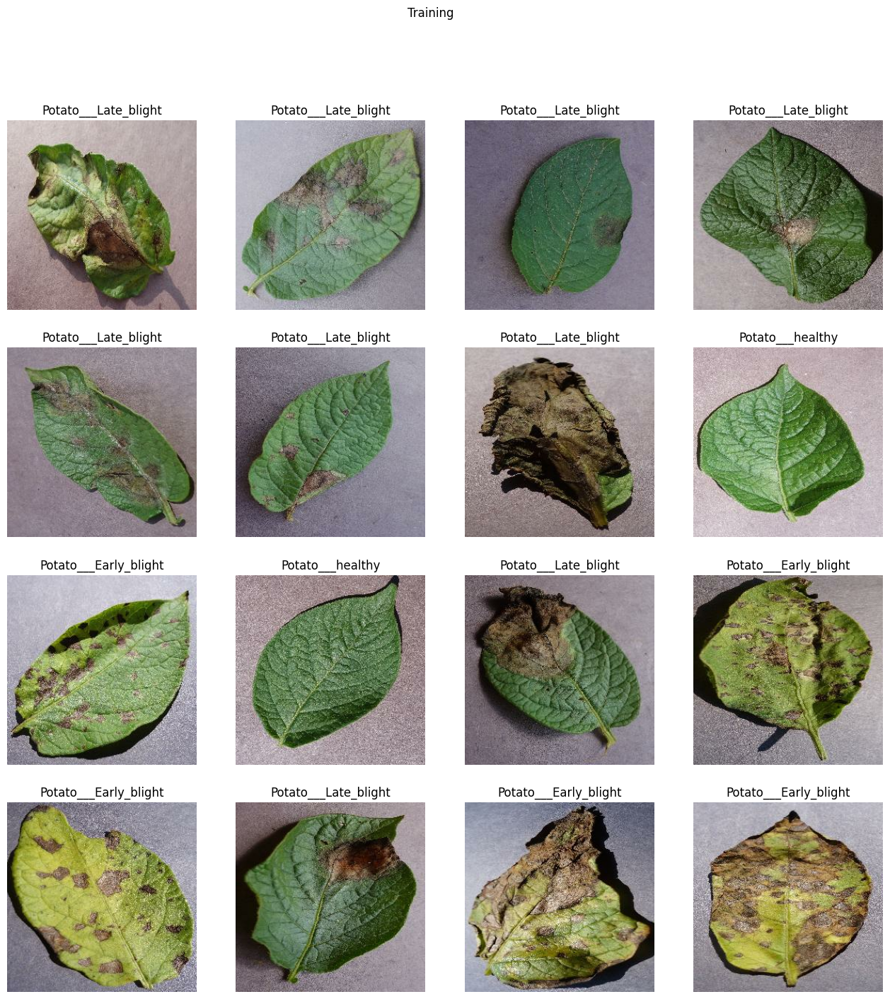

In [ ]:
display_dataset(train_ds, title='Training')

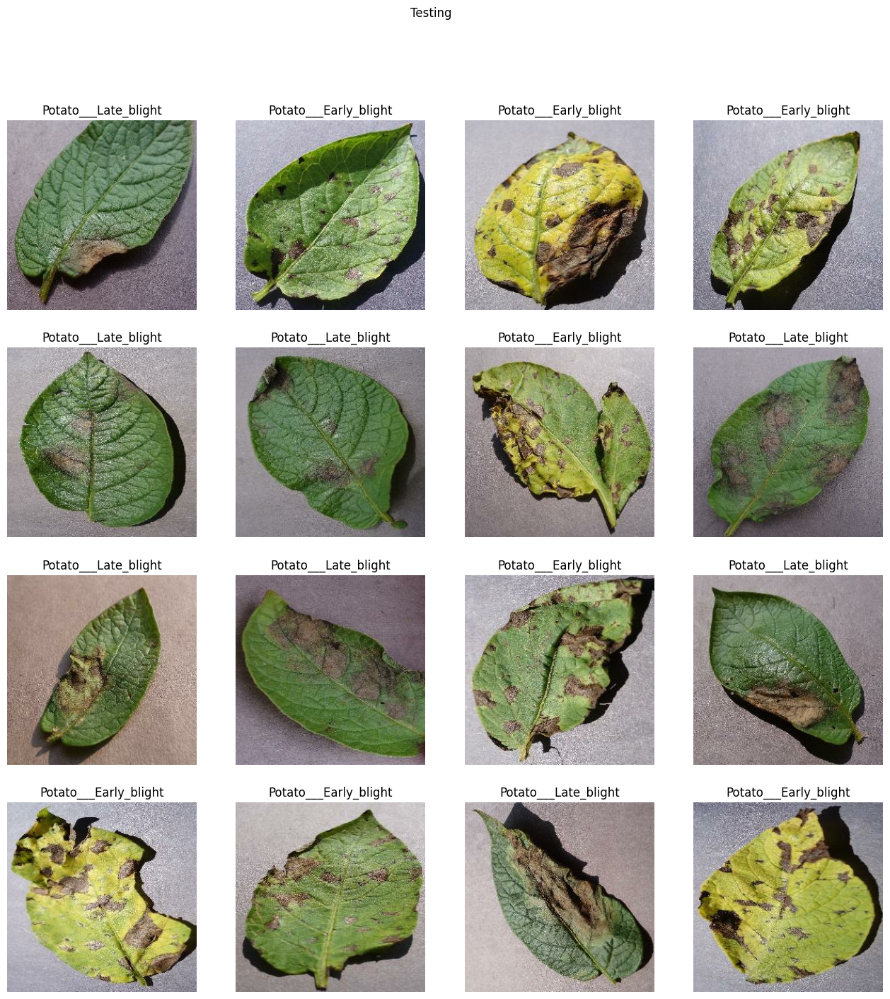

In [ ]:
display_dataset(test_ds, 'Testing')

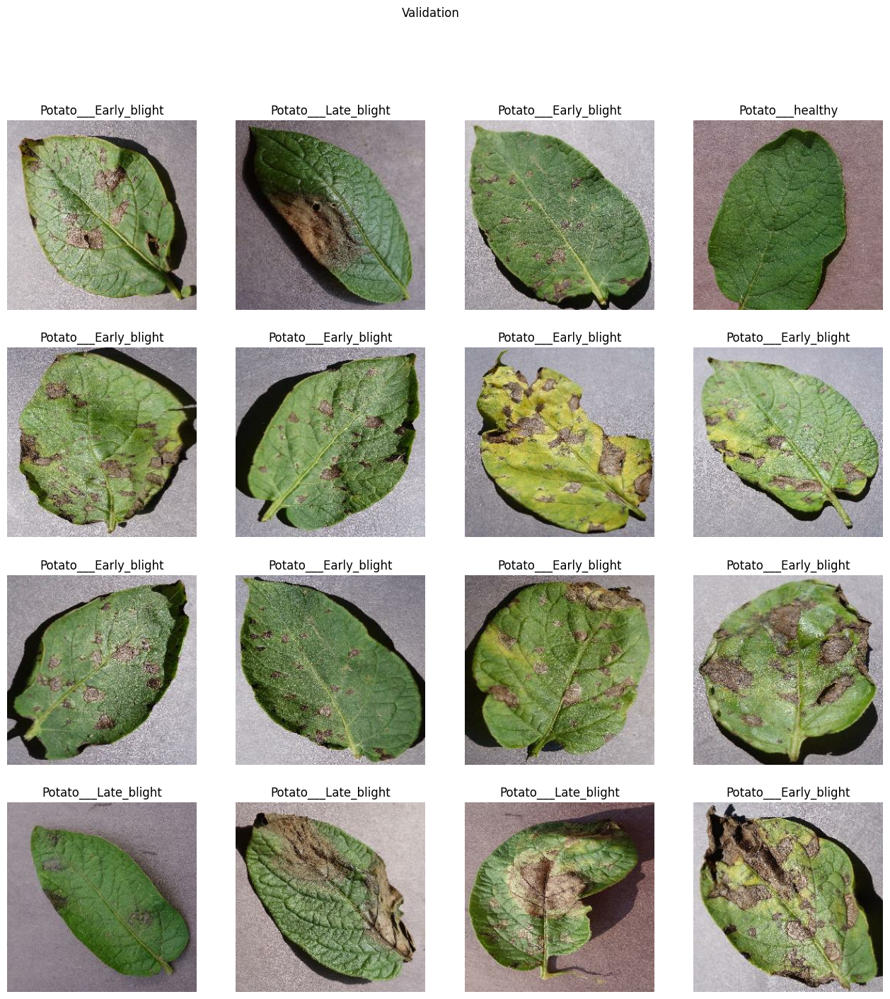

In [ ]:
display_dataset(val_ds, 'Validation')

In [ ]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

## Preprocessing

In [ ]:
resize_and_rescale = tf.keras.models.Sequential([
    tf.keras.layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    tf.keras.layers.experimental.preprocessing.Rescaling(1.0/255)
])

In [ ]:
data_augmentation = tf.keras.models.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip(),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
    tf.keras.layers.experimental.preprocessing.RandomZoom(0.2)
])

In [ ]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = len(class_names)

model = tf.keras.models.Sequential([
    resize_and_rescale,
    data_augmentation,
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(n_classes, activation='softmax')
])

model.build(input_shape=input_shape)

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 sequential_1 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d_6 (MaxPooling  (32, 127, 127, 32)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (32, 62, 62, 64)         0         
 2D)                                                  

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
history = model.fit(
    train_ds,
    epochs=50,
    batch_size=BATCH_SIZE,
    validation_data=val_ds
)

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/backend.py:5612: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


54/54 [==============================] - 8s 66ms/step - loss: 0.9457 - accuracy: 0.4671 - val_loss: 0.9406 - val_accuracy: 0.4688
Epoch 2/50
54/54 [==============================] - 3s 61ms/step - loss: 0.9038 - accuracy: 0.4994 - val_loss: 0.8924 - val_accuracy: 0.4866
Epoch 3/50
54/54 [==============================] - 3s 61ms/step - loss: 0.7139 - accuracy: 0.6673 - val_loss: 0.7289 - val_accuracy: 0.6830
Epoch 4/50
54/54 [==============================] - 3s 62ms/step - loss: 0.5776 - accuracy: 0.7612 - val_loss: 0.7122 - val_accuracy: 0.7009
Epoch 5/50
54/54 [==============================] - 3s 61ms/step - loss: 0.5658 - accuracy: 0.7635 - val_loss: 0.5283 - val_accuracy: 0.7679
Epoch 6/50
54/54 [==============================] - 4s 67ms/step - loss: 0.4392 - accuracy: 0.8304 - val_loss: 0.4412 - val_accuracy: 0.7902
Epoch 7/50
54/54 [==============================] - 4s 65ms/step - loss: 0.4191 - accuracy: 0.8292 - val_loss: 0.3458 - val_accuracy: 0.8482
Epoch 8/50
54/54 [======

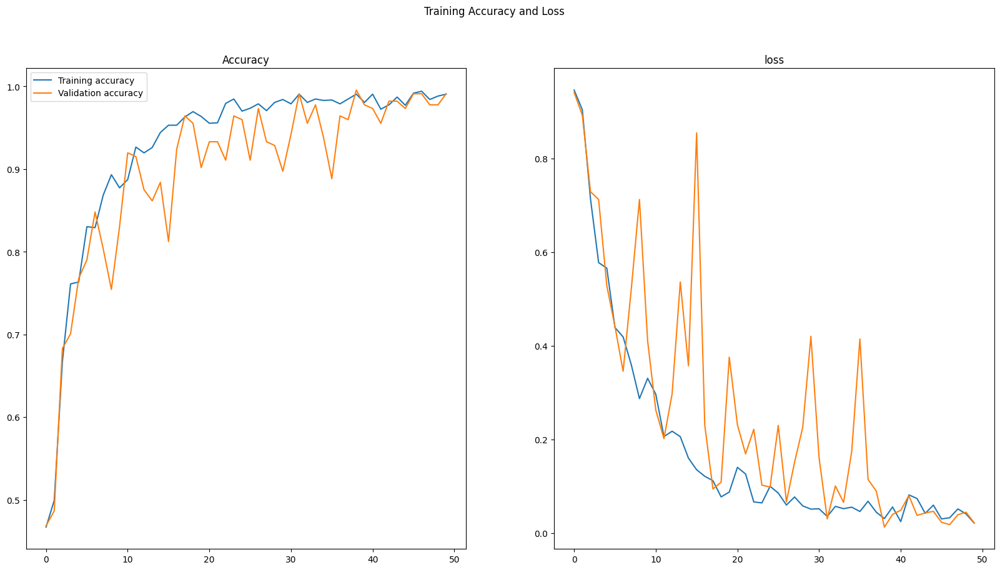

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(range(50), acc, label='Training accuracy')
plt.plot(range(50), val_acc, label='Validation accuracy')
plt.legend()
plt.title('Accuracy')
plt.subplot(1,2,2)
plt.plot(range(50), loss, label='Training loss')
plt.plot(range(50), val_loss, label='Validation loss')
plt.title('loss')
plt.suptitle('Training Accuracy and Loss')
plt.show()

In [ ]:
model.evaluate(test_ds)

7/7 [==============================] - 0s 31ms/step - loss: 0.1742 - accuracy: 0.9732


[0.17423151433467865, 0.9732142686843872]

Image to to predict
Actual Image Label: Potato___Late_blight
1/1 [==============================] - 0s 131ms/step
Predicted Image Label: Potato___Late_blight


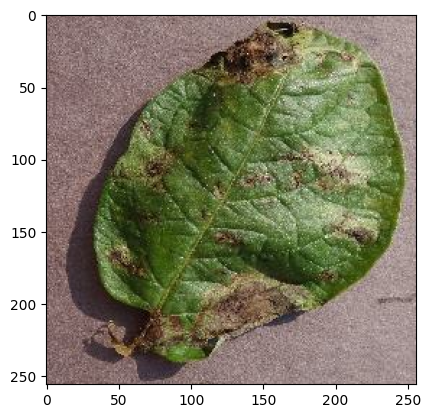

In [ ]:
for image_batch, label_batch in test_ds.take(1):
  first_image = image_batch[0].numpy().astype('uint8')
  first_label = label_batch[0].numpy()

  print('Image to to predict')
  plt.imshow(first_image)

  print(f'Actual Image Label: {class_names[first_label]}')

  batch_prediction = model.predict(image_batch)
  image_prediction = np.argmax(batch_prediction[0])

  print(f'Predicted Image Label: {class_names[image_prediction]}')

In [ ]:
from tensorflow.keras.utils import load_img, img_to_array

In [ ]:
def predict_image(model, img):
  img_array = img_to_array(img)
  img_array = tf.expand_dims(img_array, 0)

  prediction = model.predict(img_array)

  predicted_class = class_names[np.argmax(prediction)]
  confidence = round(100 * (np.max(prediction[0])), 2)

  return predicted_class, confidence

1/1 [==============================] - 0s 24ms/step


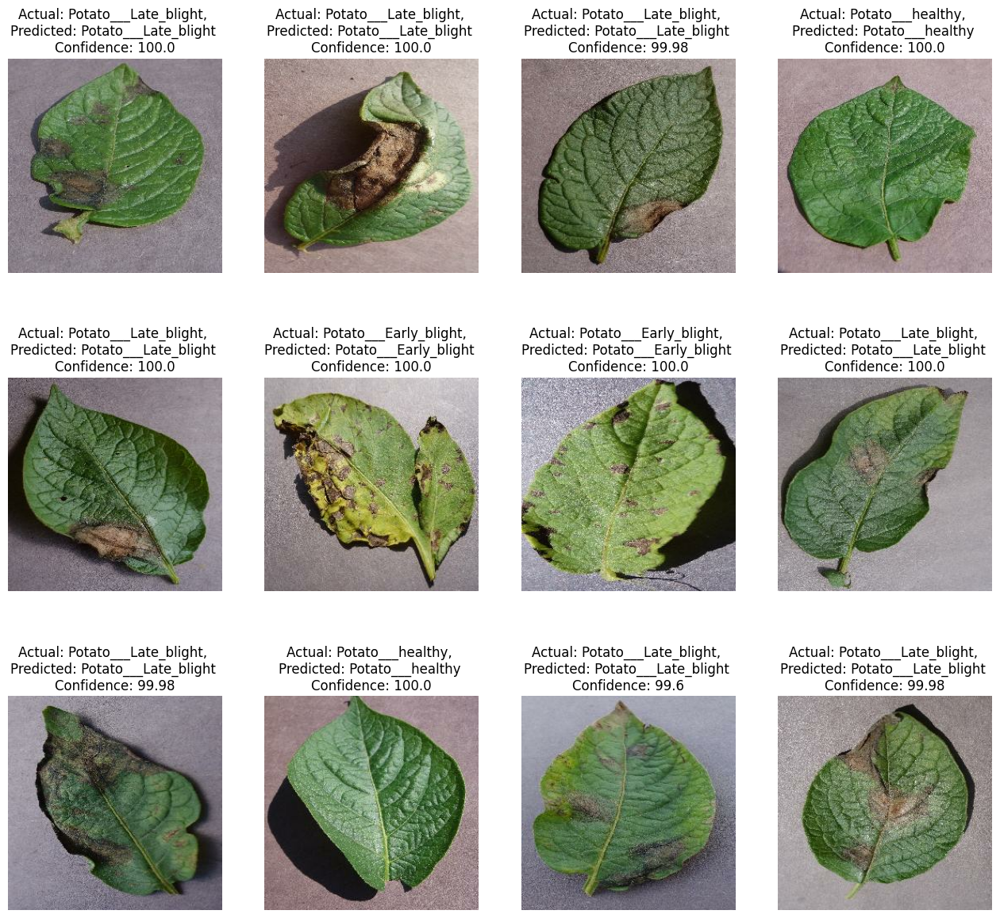

In [ ]:
fig = plt.gcf()
fig.set_size_inches(16, 20)

for image_batch, image_label in test_ds.take(1):
  for i in range(12):
    plt.subplot(4,4,i+1)
    plt.imshow(image_batch[i].numpy().astype('uint8'))
    predicted_class, confidence = predict_image(model, image_batch[i])
    plt.title(f'Actual: {class_names[image_label[i]]}, \nPredicted: {predicted_class} \nConfidence: {confidence}')
    plt.axis('off')
    plt.grid(False)

plt.show()

In [ ]:
model_version = 1
model.save(f'./models/{model_version}')

In [ ]:
!zip -r './model' './models/1'

updating: models/1/ (stored 0%)
updating: models/1/saved_model.pb (deflated 90%)
updating: models/1/fingerprint.pb (stored 0%)
updating: models/1/keras_metadata.pb (deflated 94%)
updating: models/1/assets/ (stored 0%)
updating: models/1/variables/ (stored 0%)
updating: models/1/variables/variables.index (deflated 68%)
updating: models/1/variables/variables.data-00000-of-00001 (deflated 13%)


In [ ]:
from google.colab import files
files.download("./model.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>